In [ ]:
#GENERAL
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.cm as mtpltcm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import colors
import random
import time


In [ ]:
#PATH PROCESS

import os
import os.path
from pathlib import Path
import glob
from scipy.io import loadmat
import nibabel as nib
import csv
from astropy.visualization import astropy_mpl_style
from astropy.utils.data import get_pkg_data_filename
from astropy.io import fits
import astropy
from astropy import units as u 
import astropy.wcs as fitswcs
#from specutils import Spectrum1D, SpectralRegion
from astropy.cosmology import WMAP9 as Cosmology

In [ ]:

from PIL import Image
from keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras.preprocessing import image
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from scipy.ndimage.filters import convolve
from skimage import data, io, filters
import skimage.morphology as morph
import skimage.exposure as skie
import skimage
from skimage.morphology import convex_hull_image, erosion
from IPython import display
from scipy.ndimage import gaussian_filter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib.patches as patches

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras import regularizers
from sklearn.preprocessing import LabelEncoder
import sklearn
from scipy.io.wavfile import read, write
import librosa
import librosa.display
import IPython
from IPython.display import Audio
import scipy
from scipy import signal
from scipy.fft import fftshift

In [ ]:
from warnings import filterwarnings



In [ ]:



filterwarnings("ignore",category=DeprecationWarning)

filterwarnings("ignore", category=FutureWarning) 
filterwarnings("ignore", category=UserWarning)
filterwarnings("ignore", category=RuntimeWarning)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
!unzip /content/gdrive/MyDrive/GALAXIES_CENTER.zip
NEAR_INFRARED_PATH = "/content/NGC6946/NEAR_INFRARED/n4k48nbsq_cal.fits"
HST_OPTICAL_PATH = "/content/NGC6946/OPTICAL/HST/idk404050/idk404050_drc.fits"
XMM_NEWTON_PATH = "/content/NGC6946/XMM_NEWTON_Soft_Xray/P0200670301EPX0003COLIM8000.FTZ"
XMM_OM_PATH = "/content/NGC6946/XMM_OM_Optical/P0200670301OMX000LSIMAGB000.FTZ"
ISO_PATH = "/content/NGC6946/ISO/csp3390040401.fits"

Mounted at /content/gdrive
Archive:  /content/gdrive/MyDrive/GALAXIES_CENTER.zip
  inflating: M100/ISO/csli23500615.fits  
  inflating: M100/NEAR_INFRARED/idkv31030_drz.fits  
  inflating: M100/OPTICAL/hst_05195_01_wfpc2_f702w_pc_drz.fits  
  inflating: M100/XMM_Newton_Soft_Xray/P0106860201EPX0003COLIM8000.FTZ  
  inflating: M100/XMM_OM_Optical/P0106860201OMX000USIMAGU000.FTZ  
  inflating: M101/ISO/csli26902583.fits  
  inflating: M101/NEAR_INFRARED/hst_11080_a6_nic_nic3_f187n_drz.fits  
  inflating: M101/OPTICAL/hst_13361_03_wfc3_uvis_f502n_drz.fits  
  inflating: M101/XMM_Newton_Soft_Xray/P0164560701EPX0003COLIM8000.FTZ  
  inflating: M101/XMM_OM_Optical/P0212480201OMX000USIMAGU000.FTZ  
  inflating: M31/ISO/csp4000162201.fits  
  inflating: M31/NEAR_INFRARED/hst_7919_13_nic_nic3_f160w_drz.fits  
  inflating: M31/OPTICAL/hst_05464_02_wfpc2_f814w_pc_drz.fits  
  inflating: M31/XMM_NEWTON_Soft_Xray/P0112570401EPX0003COLIM8000.FTZ  
  inflating: M31/XMM_OM_Optical/P0112570601OMX000USIM

In [ ]:

NI_OPEN = fits.open(NEAR_INFRARED_PATH)
HST_OPEN = fits.open(HST_OPTICAL_PATH)
XMM_NEWTON_OPEN = fits.open(XMM_NEWTON_PATH)
XMM_OM_OPEN = fits.open(XMM_OM_PATH)
ISO_OPEN = fits.open(ISO_PATH)


In [ ]:

HST_SCI=HST_OPEN[1].data

ZOOMED_X3_SCALE_HST = HST_SCI[2450:2850,2300:2700]
NUCLEUS_SCALE_HST = HST_SCI[2640:2850,2330:2650]

# Applying filter

In [ ]:

SATO_ZOOMED_X3_SCALE_HST = filters.sato(ZOOMED_X3_SCALE_HST)
SATO_NUCLEUS_SCALE_HST = filters.sato(NUCLEUS_SCALE_HST)

M_ZOOMED_X3_SCALE_HST = filters.meijering(ZOOMED_X3_SCALE_HST)
M_NUCLEUS_SCALE_HST = filters.meijering(NUCLEUS_SCALE_HST)

In [ ]:
BM_ZOOMED_X3_SCALE_HST = filters.meijering(ZOOMED_X3_SCALE_HST,black_ridges=False)
BM_NUCLEUS_SCALE_HST = filters.meijering(NUCLEUS_SCALE_HST,black_ridges=False)

In [ ]:

HST_OPEN[0].header["RA_TARG"]

308.714475

In [ ]:
HST_OPEN[0].header["DEC_TARG"]

60.15866944444

In [ ]:
SPECTRAL_LIST = ["gray","jet","hot","prism","nipy_spectral",
             "gist_ncar","gist_earth","gist_stern","flag","gnuplot2",'terrain']

### Gaussian Filter: Overview and Application

#### Overview:
A Gaussian filter is a linear filter used to smooth images and reduce noise by averaging pixel values with weights derived from a Gaussian function. It is widely used in image processing for its simplicity and effectiveness in noise reduction while preserving edges better than other averaging filters.

#### Key Characteristics:
- **Gaussian Function:** The filter uses a Gaussian function to calculate the weights for averaging. The Gaussian function is defined as:
  \[
  G(x, y) = \frac{1}{2\pi\sigma^2} e^{-\frac{x^2 + y^2}{2\sigma^2}}
  \]
  where \( x \) and \( y \) are the coordinates of the pixel, and \( \sigma \) is the standard deviation of the Gaussian distribution.

- **Smoothing Effect:** The filter reduces high-frequency noise, making the image appear smoother.
- **Edge Preservation:** Compared to simple averaging filters, the Gaussian filter preserves edges better because the weights decrease with distance from the center pixel.

### Application in NGC 6946 AGN Detection Project:

#### 1. **Noise Reduction:**
- **Image Smoothing:**
  - **Implementation:** Convolve the image with a Gaussian kernel to smooth the image and reduce noise. The kernel size and \( \sigma \) (standard deviation) can be adjusted based on the level of noise and the desired smoothing effect.
  - **Effect:** This process helps in minimizing random noise that can obscure important features such as spiral arms, jet structures, and potential AGN regions.

#### 2. **Normalization:**
- **Standardizing Pixel Values:**
  - **Purpose:** Normalize the pixel values of the smoothed image to ensure a consistent range of intensities across different images.
  - **Implementation:** Scale the pixel values to a range of [0, 1] or [0, 255] for further processing and analysis.
  - **Effect:** Normalization ensures that variations in brightness and contrast do not affect the subsequent steps of feature extraction and deep learning.

#### 3. **Image Quality Enhancement:**
- **Contrast Adjustment:**
  - **Purpose:** Enhance the contrast of the smoothed image to highlight features such as the galactic core, spiral arms, and potential AGN regions.
  - **Implementation:** Techniques like histogram equalization or adaptive histogram equalization can be used to improve contrast.
  - **Effect:** Enhanced contrast makes it easier to detect and analyze significant structures within NGC 6946.

- **Image Sharpening:**
  - **Purpose:** Apply sharpening filters to the smoothed image to further enhance edges and details.
  - **Implementation:** Use filters such as unsharp masking to highlight the transitions between different regions.
  - **Effect:** Sharpening emphasizes important features, aiding in accurate segmentation and feature extraction.

#### 4. **Segmentation:**
- **Focus on Regions of Interest:**
  - **Purpose:** Segment the galaxy to isolate regions of interest, such as the core, spiral arms, and potential AGN regions.
  - **Implementation:** Use thresholding or edge-detection techniques on the smoothed image to create masks for different regions.
  - **Effect:** Segmentation allows for focused analysis on specific parts of the galaxy, improving the accuracy of AGN detection.

### Summary:
The Gaussian filter is a critical tool in the preprocessing stage of the NGC 6946 AGN detection project. By reducing noise and enhancing image quality, it ensures that the images used for feature extraction and deep learning are of high quality and contain clear, distinguishable features. This preprocessing step lays the foundation for accurate and reliable AGN detection in subsequent stages of the project.

In [ ]:
GAUSS_ZOOMED_X2 = gaussian_filter(ZOOMED_X3_SCALE_HST,sigma=7)
GAUSS_NUCLEUS = gaussian_filter(NUCLEUS_SCALE_HST,sigma=7)

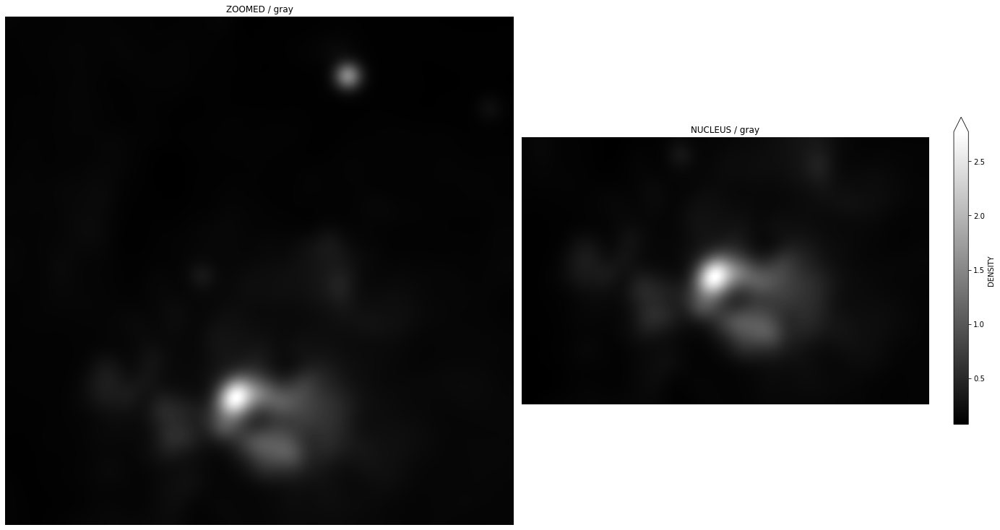

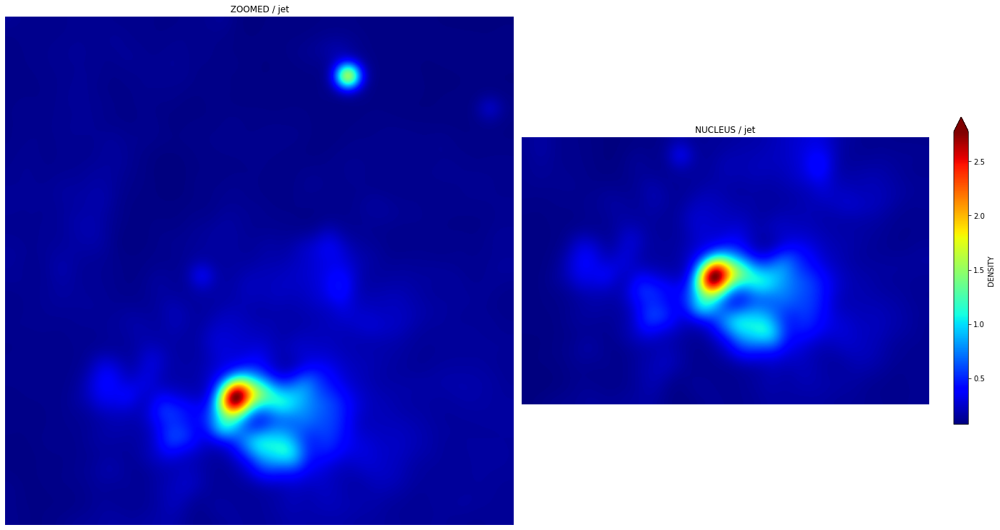

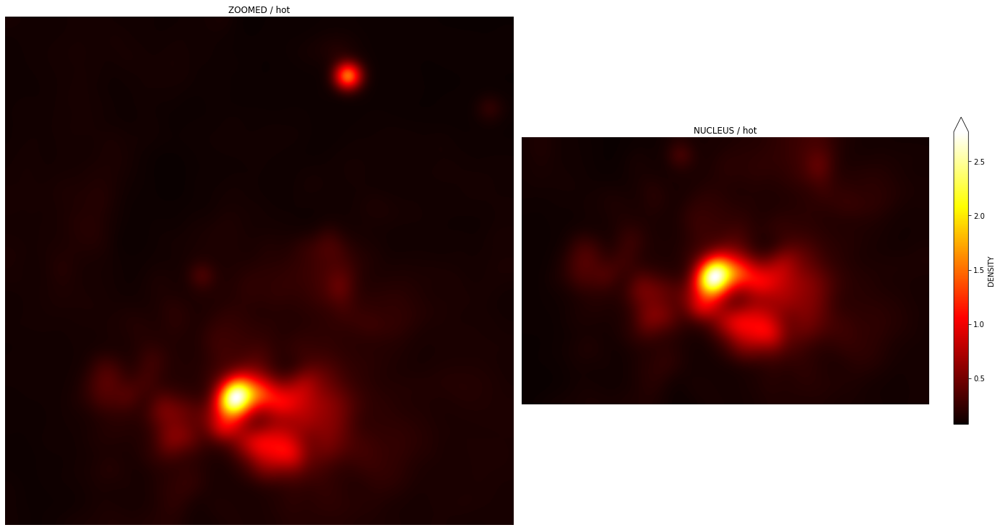

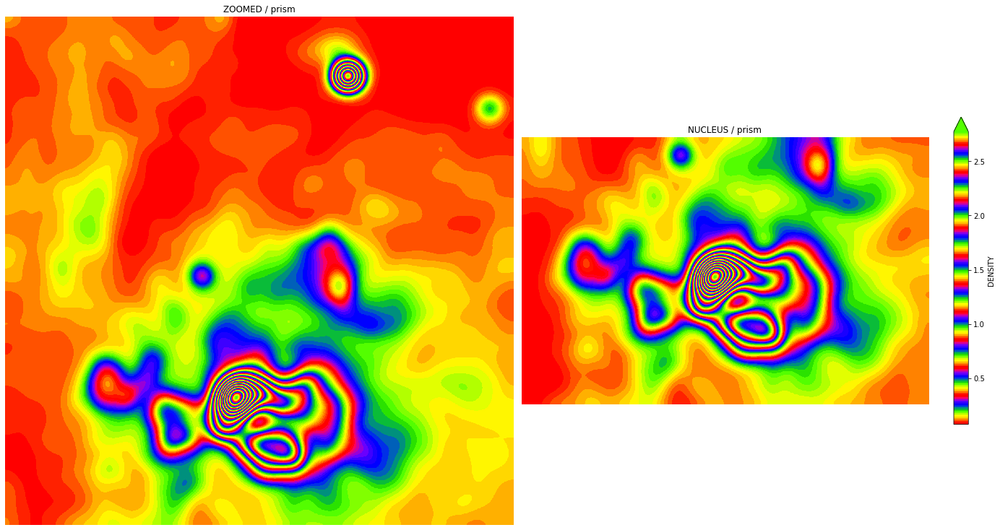

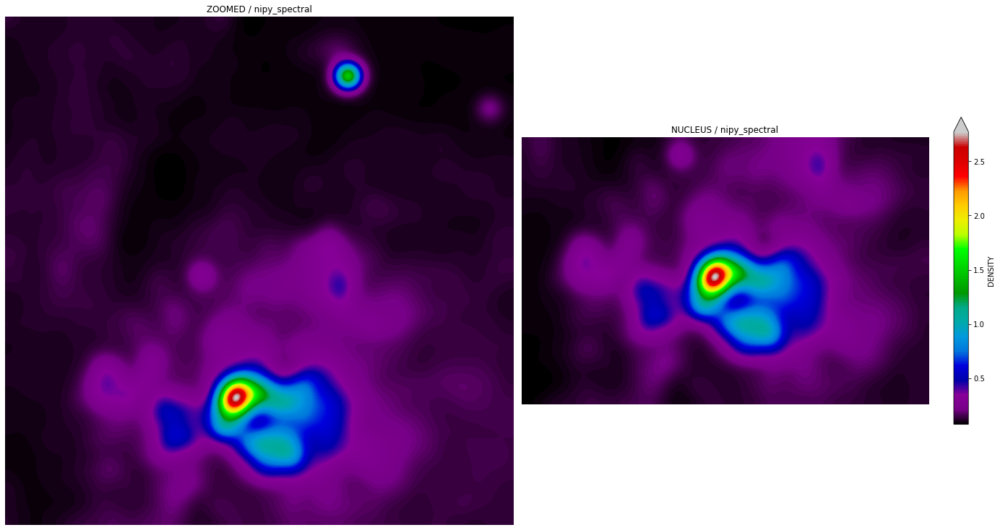

...

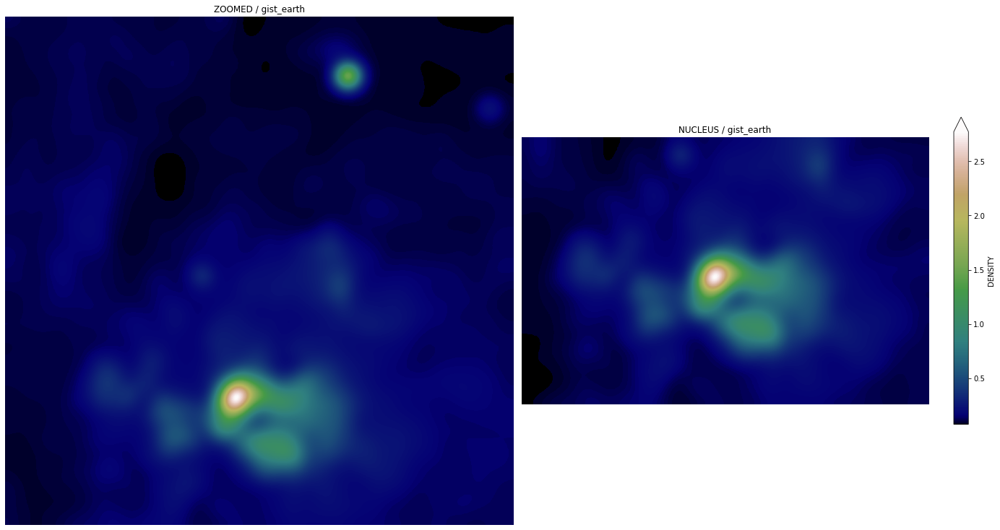

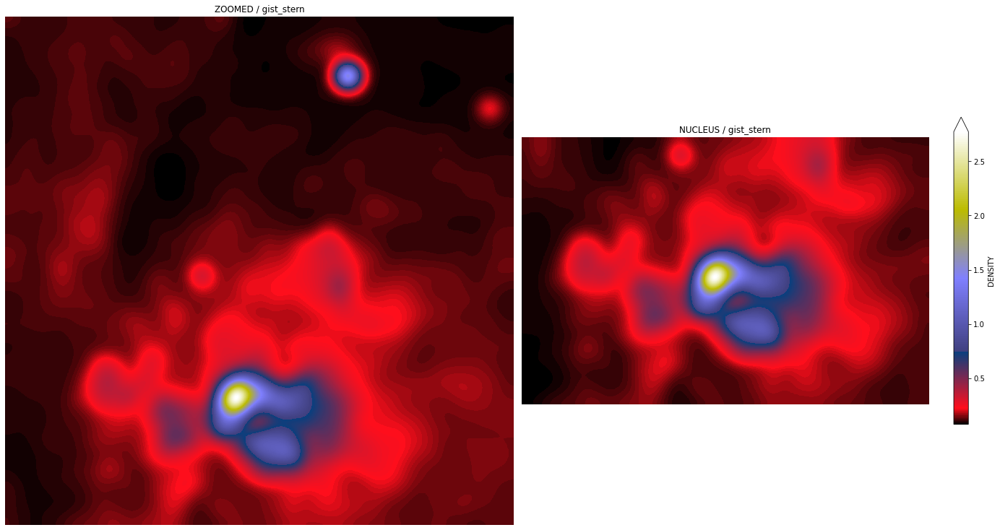

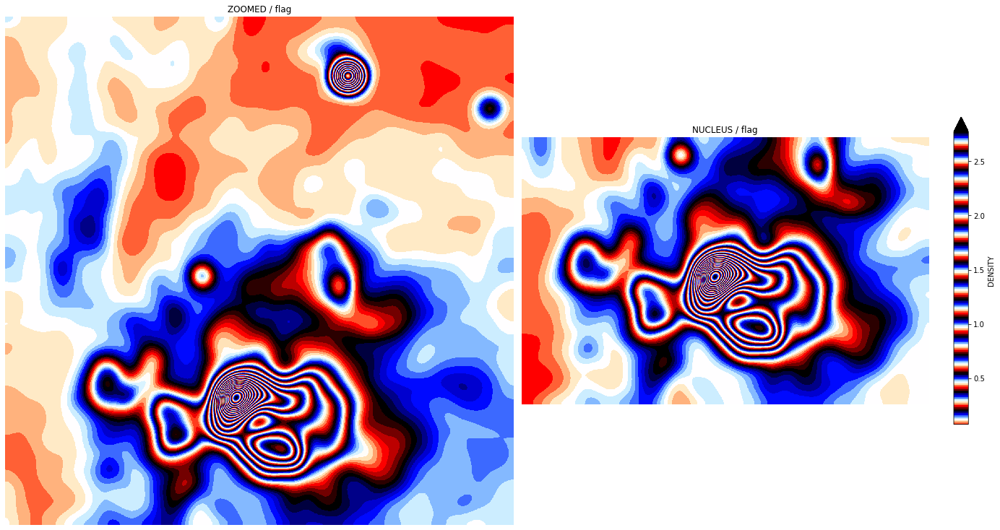

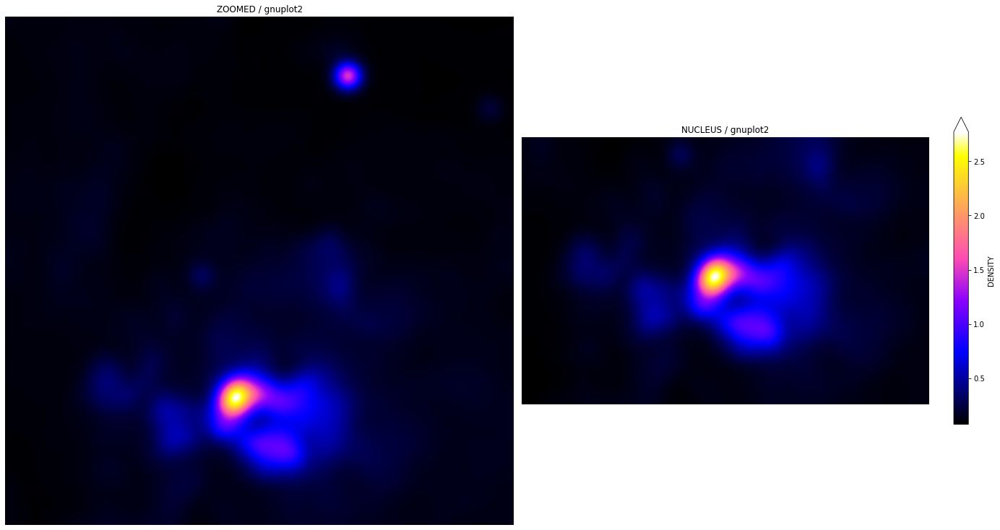

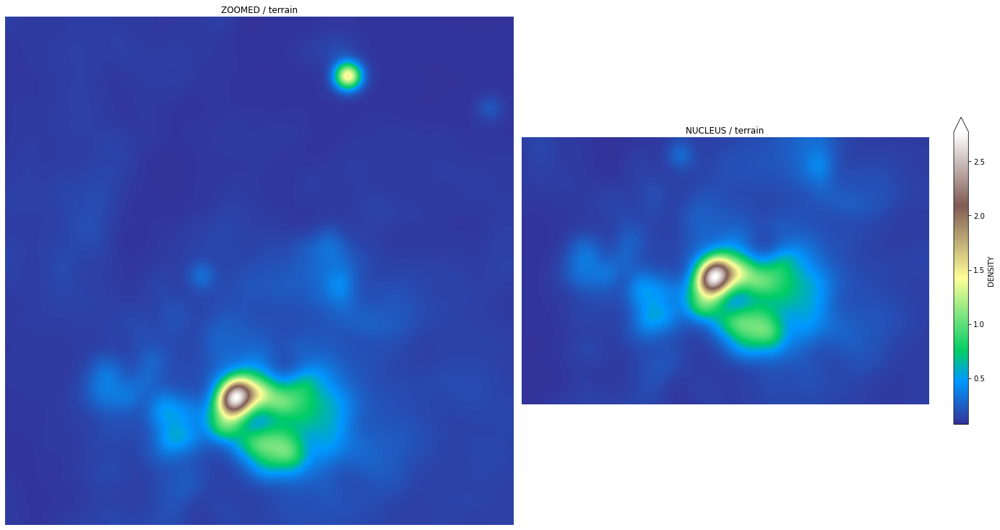

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,2,figsize=(20,20))
    
    axis[0].imshow(GAUSS_ZOOMED_X2,cmap=x_spec)
    axis[0].set_title("ZOOMED" + " / "+ x_spec)
    axis[0].axis("off")
    
    DENSITY_FUNC = axis[1].imshow(GAUSS_NUCLEUS,cmap=x_spec)
    axis[1].set_title("NUCLEUS" + " / "+ x_spec)
    axis[1].axis("off")
    
    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

In [ ]:
M_GAUSS_ZOOMED_X2 = gaussian_filter(M_ZOOMED_X3_SCALE_HST,sigma=7)
M_GAUSS_NUCLEUS = gaussian_filter(M_NUCLEUS_SCALE_HST,sigma=7)

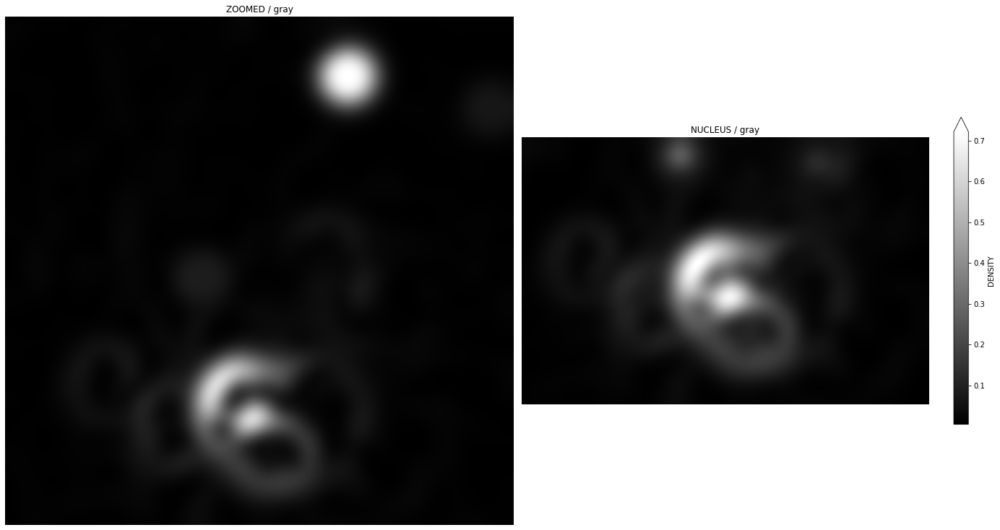

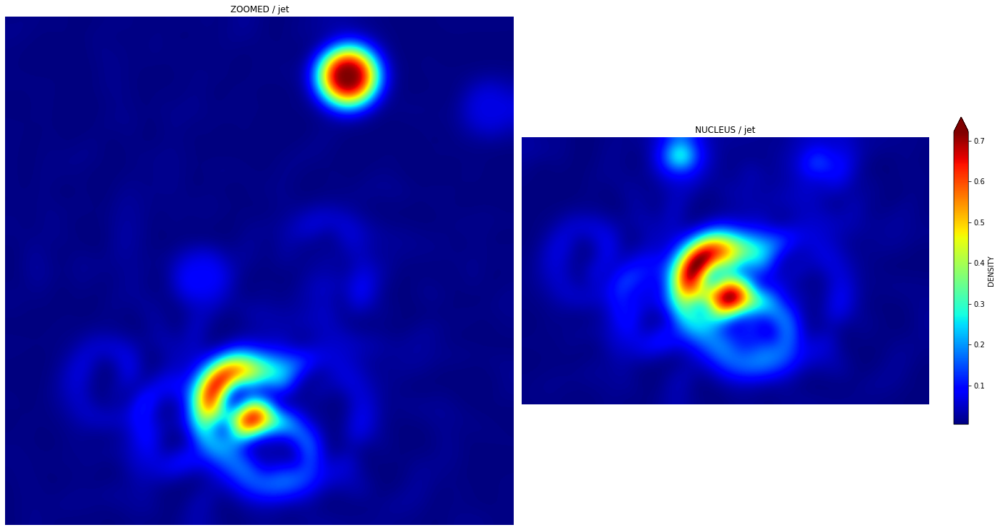

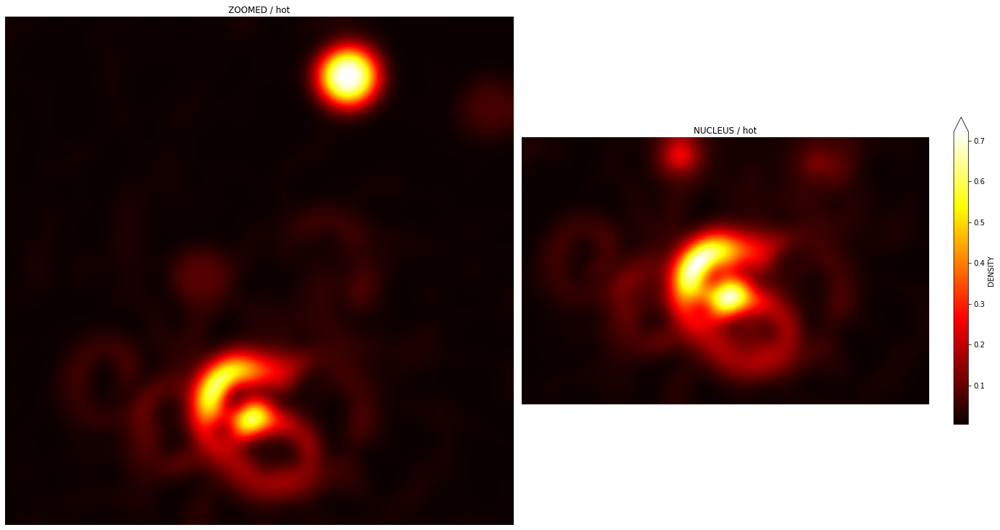

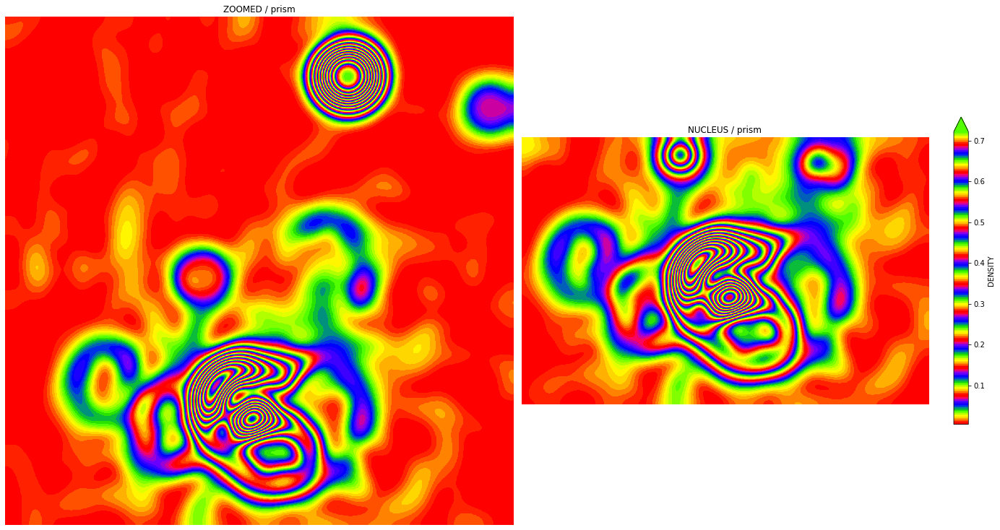

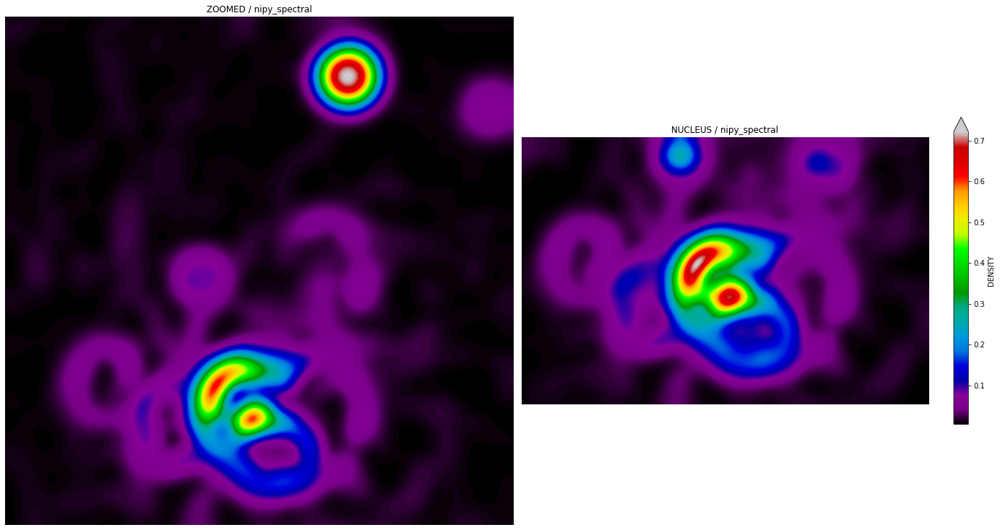

...

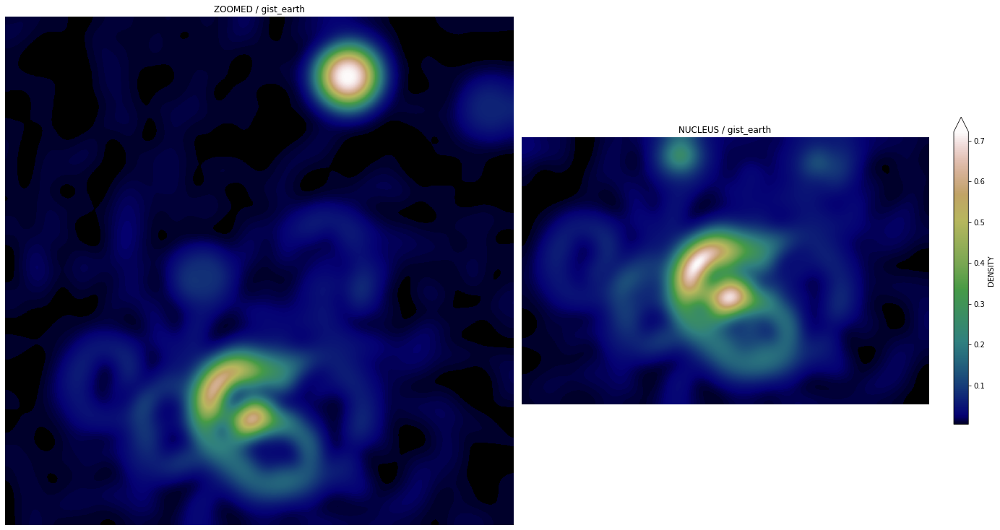

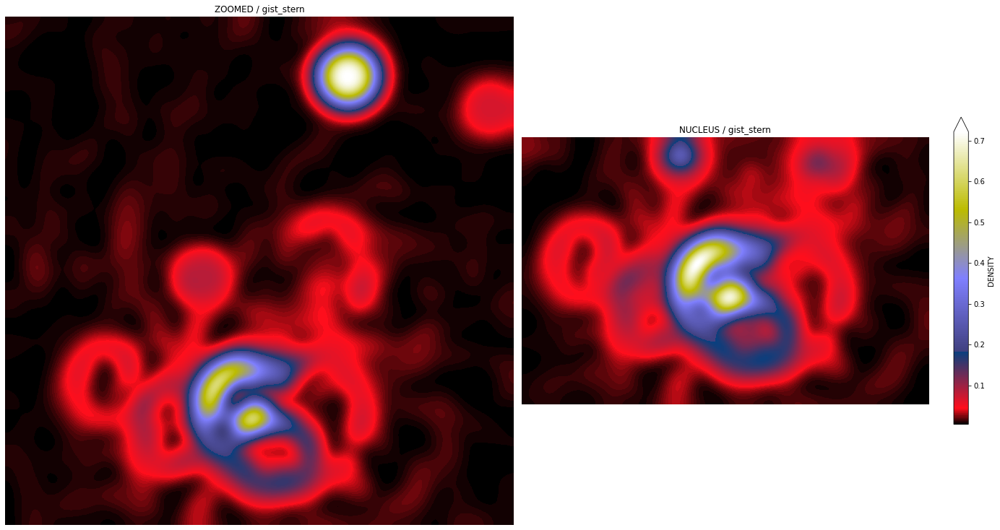

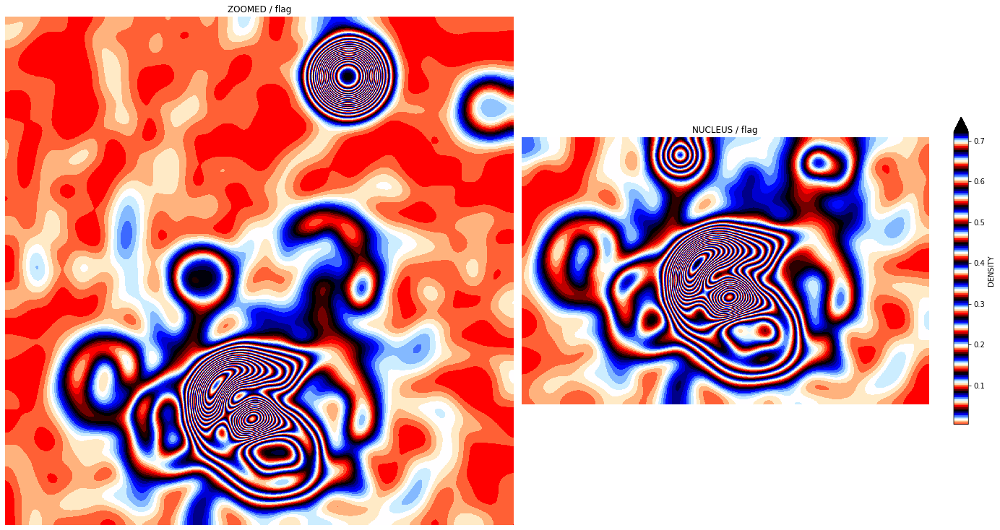

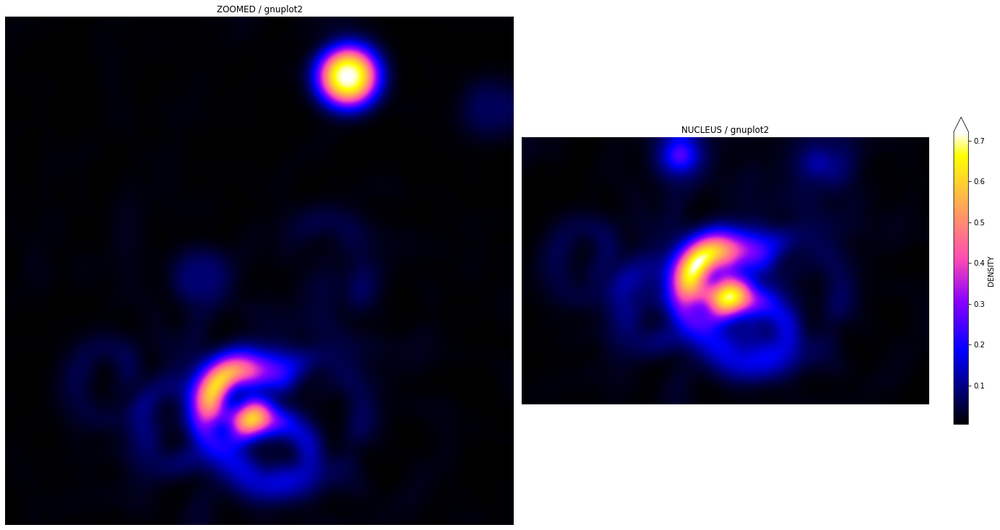

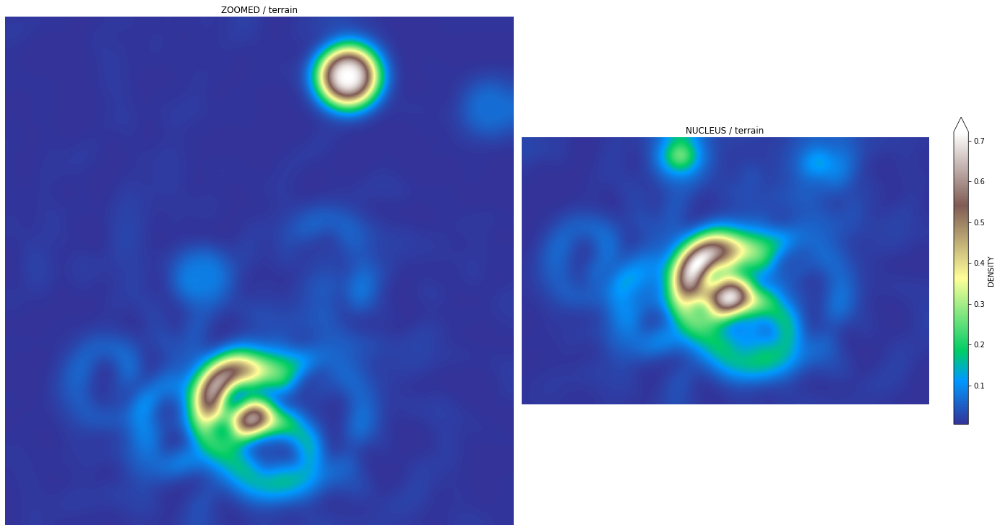

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,2,figsize=(20,20))
    
    axis[0].imshow(M_GAUSS_ZOOMED_X2,cmap=x_spec)
    axis[0].set_title("ZOOMED" + " / "+ x_spec)
    axis[0].axis("off")
    
    DENSITY_FUNC = axis[1].imshow(M_GAUSS_NUCLEUS,cmap=x_spec)
    axis[1].set_title("NUCLEUS" + " / "+ x_spec)
    axis[1].axis("off")
    
    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

In [ ]:
BM_GAUSS_ZOOMED_X2 = gaussian_filter(BM_ZOOMED_X3_SCALE_HST,sigma=5)
BM_GAUSS_NUCLEUS = gaussian_filter(BM_NUCLEUS_SCALE_HST,sigma=5)

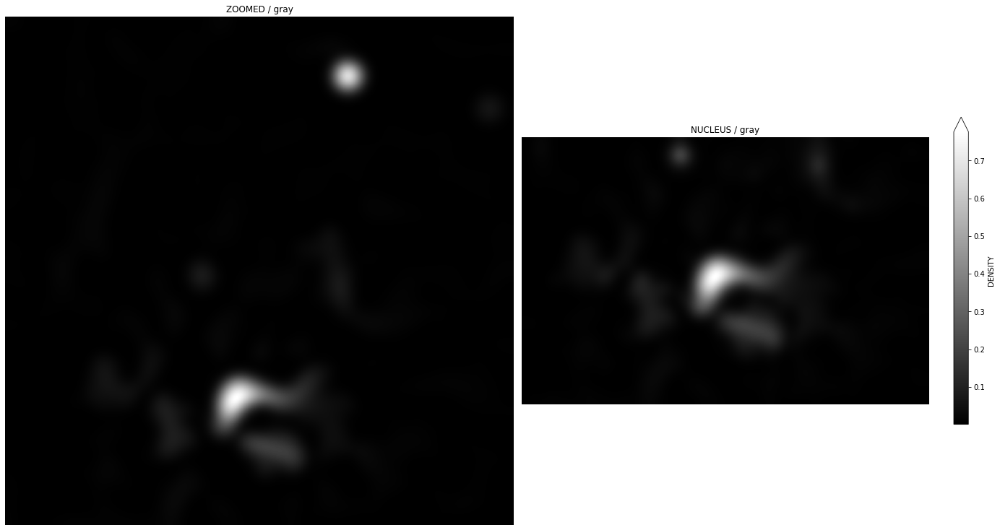

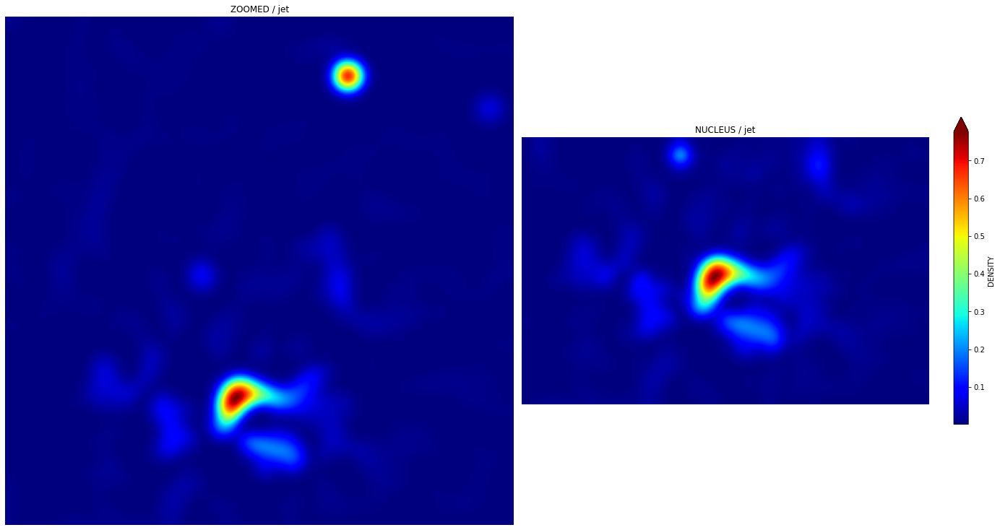

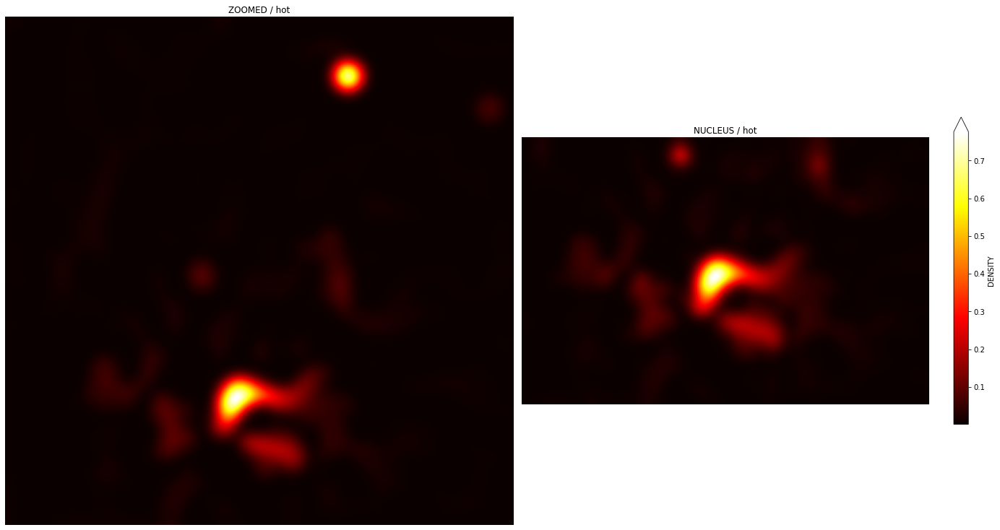

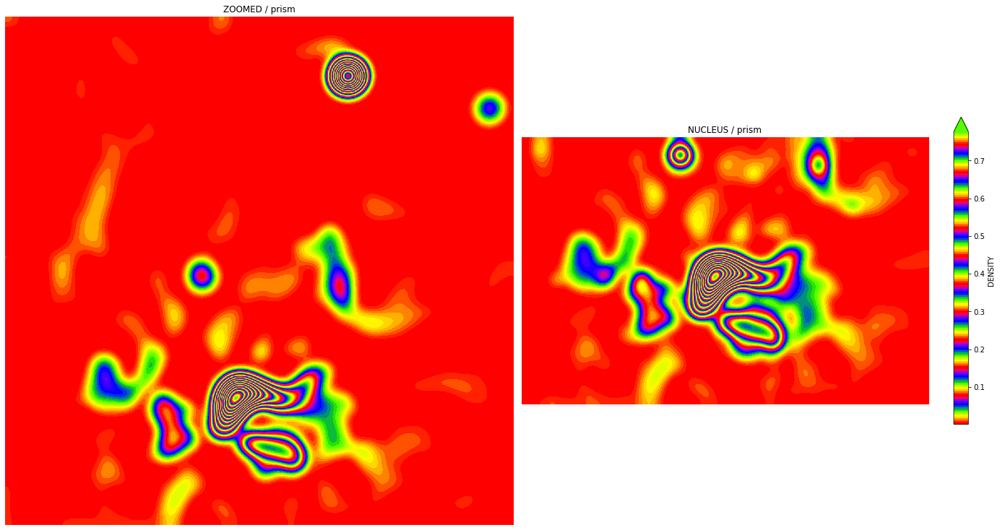

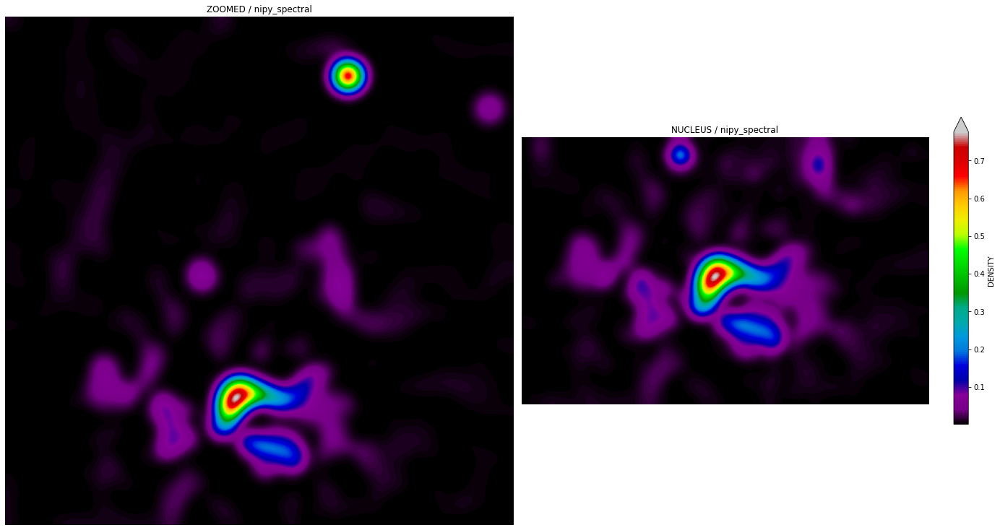

...

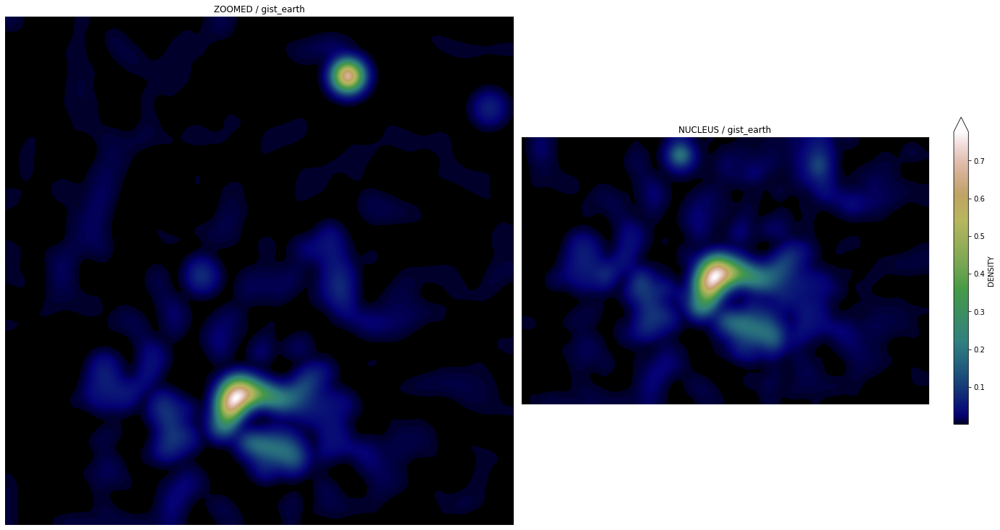

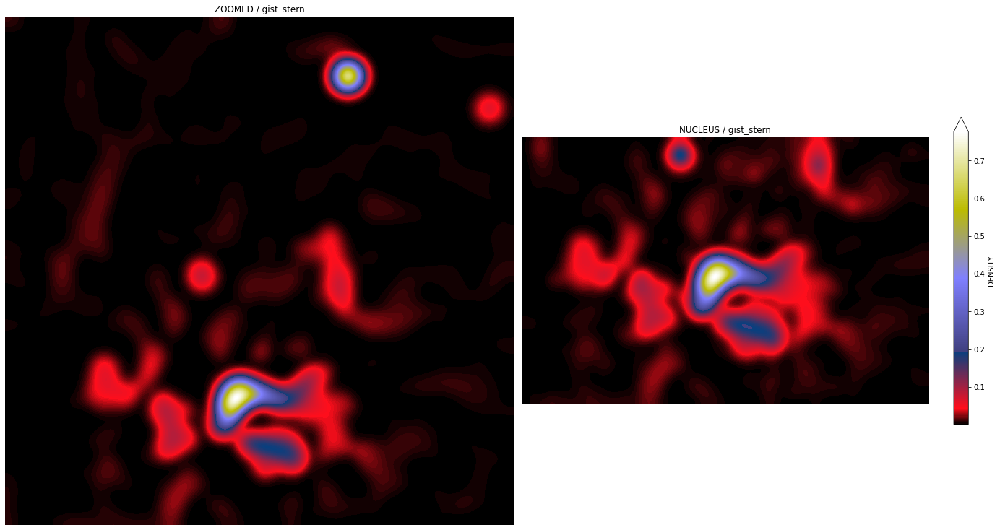

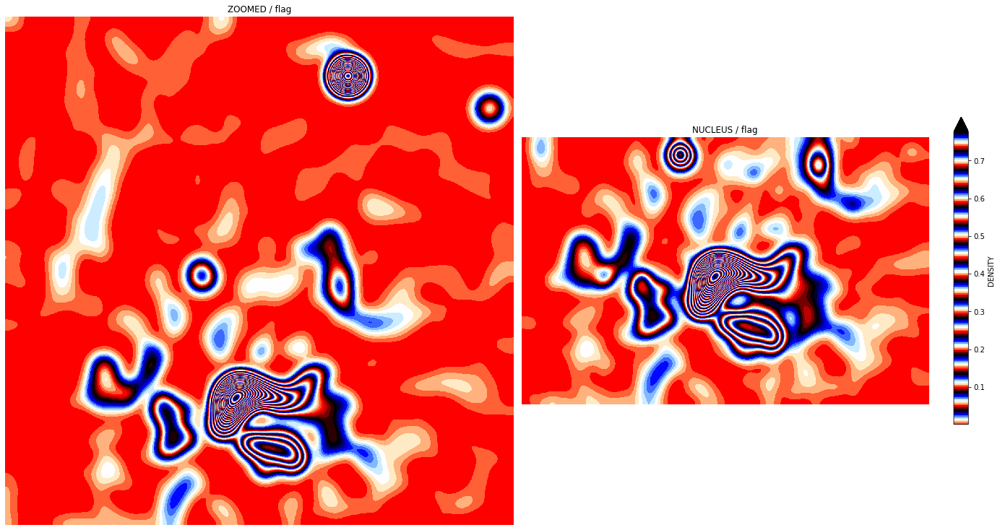

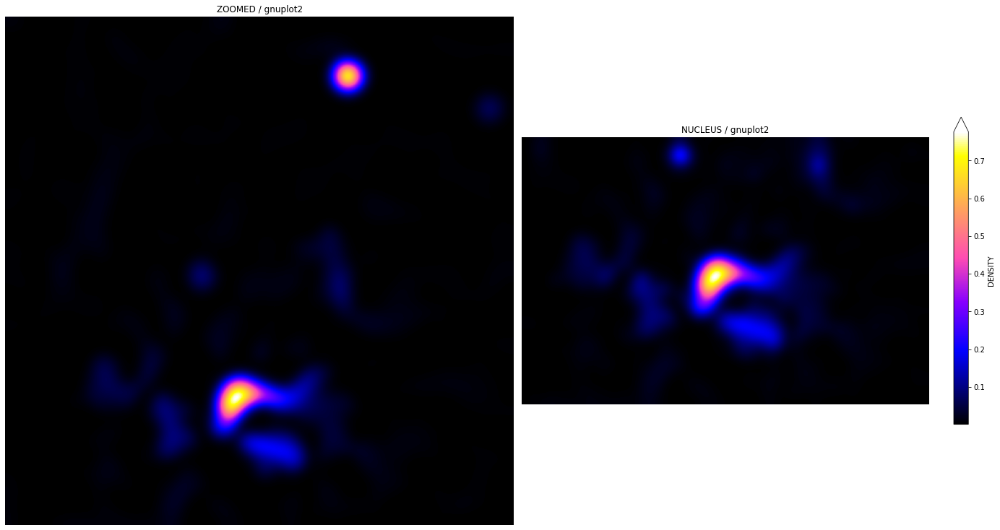

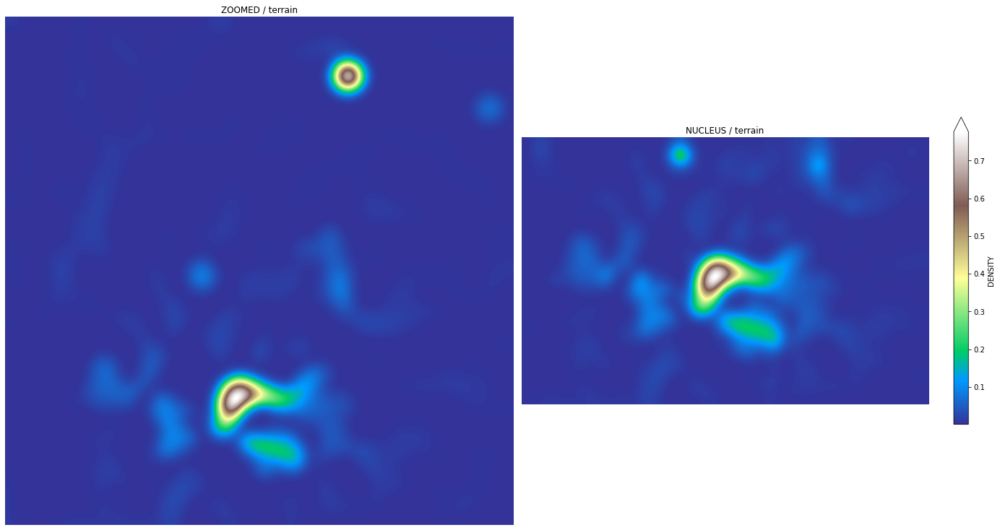

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,2,figsize=(20,20))
    
    axis[0].imshow(BM_GAUSS_ZOOMED_X2,cmap=x_spec)
    axis[0].set_title("ZOOMED" + " / "+ x_spec)
    axis[0].axis("off")
    
    DENSITY_FUNC = axis[1].imshow(BM_GAUSS_NUCLEUS,cmap=x_spec)
    axis[1].set_title("NUCLEUS" + " / "+ x_spec)
    axis[1].axis("off")
    
    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

# Feature

# CLAHE Histogram Equalization – OpenCV
Contrast Limited Adaptive Histogram Equalization (CLAHE) to equalize images. CLAHE is a variant of Adaptive histogram equalization (AHE) which takes care of over-amplification of the contrast. CLAHE operates on small regions in the image, called tiles, rather than the entire image. The neighboring tiles are then combined using bilinear interpolation to remove the artificial boundaries. 
This algorithm can be applied to improve the contrast of images.
We can also apply CLAHE to color images, where usually it is applied on the luminance channel and the results after equalizing only the luminance channel of an HSV image are much better than equalizing all the channels of the BGR image. 
In this tutorial, we are going to learn how to apply CLAHE and process a given input image for histogram equalization.

Applying CLAHE (Contrast Limited Adaptive Histogram Equalization) using OpenCV for the NGC 6946 AGN detection project involves several steps to enhance image quality while preserving important features. Here's a detailed application of CLAHE within this context:

### 1. Purpose of CLAHE in the Project:
- **Enhancing Image Contrast:** CLAHE is used to improve the contrast of astronomical images, particularly those of NGC 6946, by adapting histogram equalization locally.
  
- **Preserving Structural Details:** It ensures that the contrast enhancement does not lead to over-amplification of noise, thus preserving important structural features like spiral arms, potential AGN regions, and galactic morphology.

### 2. Image Preprocessing Stage:
- **Initial Image Load:** The project starts by loading high-resolution images of NGC 6946 obtained from astronomical databases.
  
- **Grayscale Conversion:** As astronomical images are often represented in multi-band formats, converting the images to grayscale simplifies processing while retaining essential intensity information.

### 3. CLAHE Parameter Selection:
- **clipLimit Adjustment:** Determine an appropriate clipLimit value based on the image characteristics and desired enhancement level. Higher values allow for more contrast enhancement but can introduce artifacts if set too high.
  
- **Tile Grid Size Definition:** Choose the tileGridSize parameter to define the size of the grid for local histogram equalization. Smaller grid sizes capture fine details but may lead to noise amplification, while larger grids provide smoother results but may lose localized details.

### 4. CLAHE Application:
- **Adaptive Histogram Equalization:** Apply CLAHE to the grayscale images using OpenCV's `createCLAHE` function with the chosen parameters (clipLimit and tileGridSize).
  
- **Enhanced Image Generation:** The application of CLAHE results in enhanced images with improved contrast and preserved structural details, making important features more distinguishable for subsequent analysis.

### 5. Image Quality Assessment:
- **Visual Inspection:** Perform a visual assessment of the CLAHE-enhanced images to ensure that the contrast enhancement is effective without introducing artifacts or noise amplification.
  
- **Comparison with Original Images:** Compare the CLAHE-enhanced images with the original images to evaluate the improvement in contrast and the preservation of key features.

### 6. Integration with Deep Learning or Feature Extraction:
- **Input for Deep Learning Models:** Utilize the CLAHE-enhanced images as inputs for deep learning models or feature extraction algorithms aimed at detecting AGN within NGC 6946.
  
- **Improved Feature Detection:** The enhanced contrast and preserved details from CLAHE can lead to more accurate feature detection, particularly in regions with subtle variations in intensity.

### 7. Iterative Optimization:
- **Parameter Tuning:** Iterate the CLAHE parameter selection process based on feedback from image quality assessment and model performance.
  
- **Fine-Tuning for Specific Regions:** Consider fine-tuning CLAHE parameters for specific regions of interest within NGC 6946, such as AGN candidate areas or regions with complex morphological features.

### 8. Documentation and Reporting:
- **Documentation of Parameters:** Document the chosen CLAHE parameters for each image processed, along with any adjustments made during the iterative optimization process.
  
- **Reporting Results:** Include visual comparisons between original and CLAHE-enhanced images, highlighting the improvements in contrast and feature visibility achieved through CLAHE.

### Summary:
In the NGC 6946 AGN detection project, CLAHE plays a crucial role in enhancing image contrast while preserving structural details. Its adaptive nature ensures that contrast enhancement is applied locally, leading to improved feature detection accuracy and a clearer understanding of galactic morphology. By carefully selecting and fine-tuning CLAHE parameters, the project can effectively enhance image quality for more robust AGN detection and analysis.

In [ ]:

Clahe_Func = cv2.createCLAHE(clipLimit=5.0,tileGridSize=(3,3))

In [ ]:
CLAHE_ZOOMED_X2 = Clahe_Func.apply(ZOOMED_X3_SCALE_HST.astype(np.uint8))
CLAHE_NUCLEUS_CLAHE = Clahe_Func.apply(NUCLEUS_SCALE_HST.astype(np.uint8))

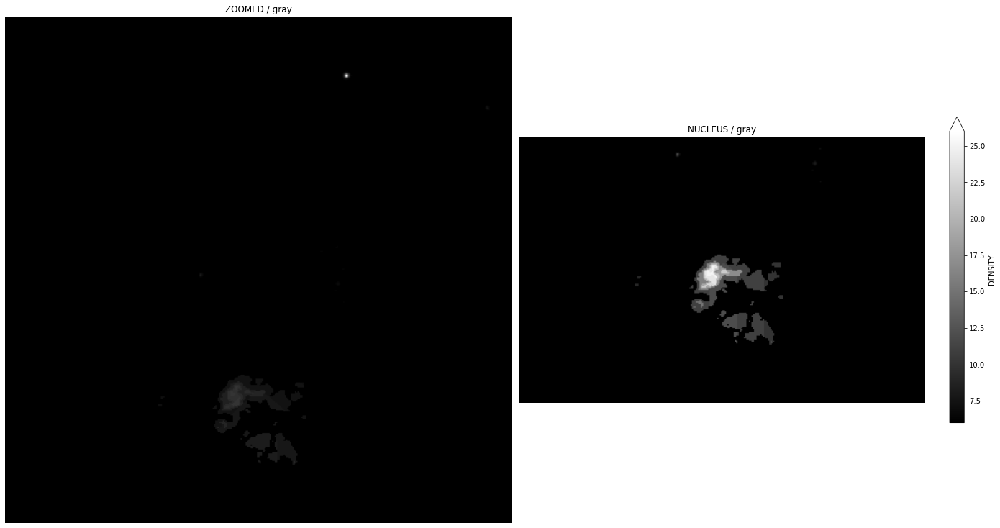

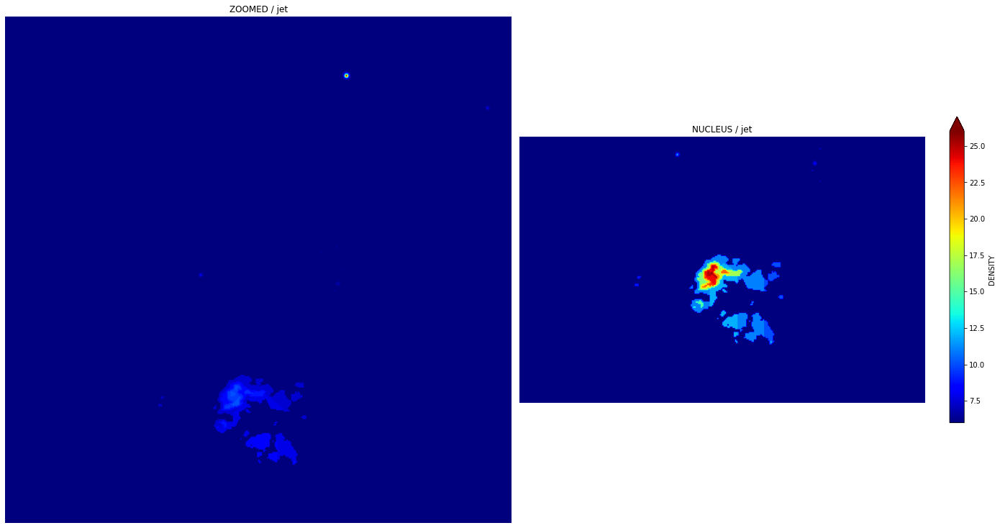

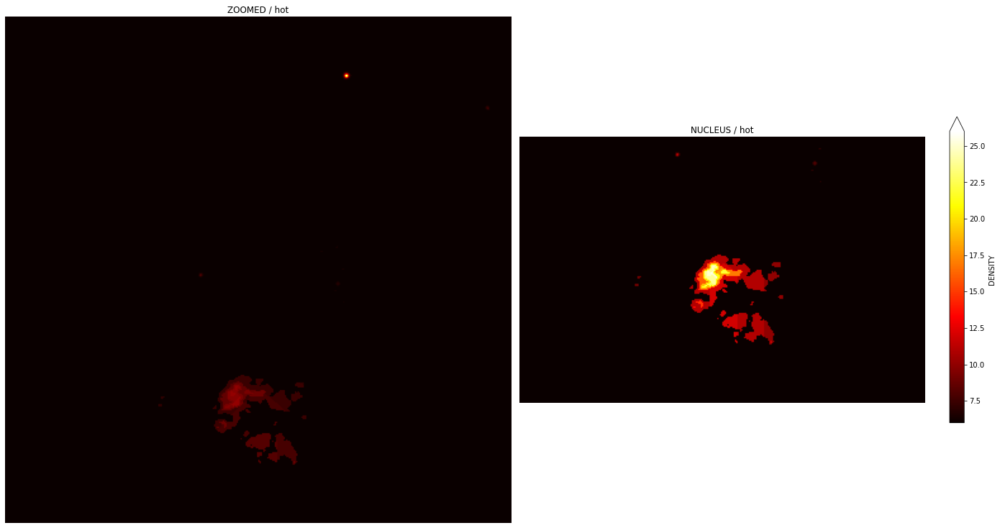

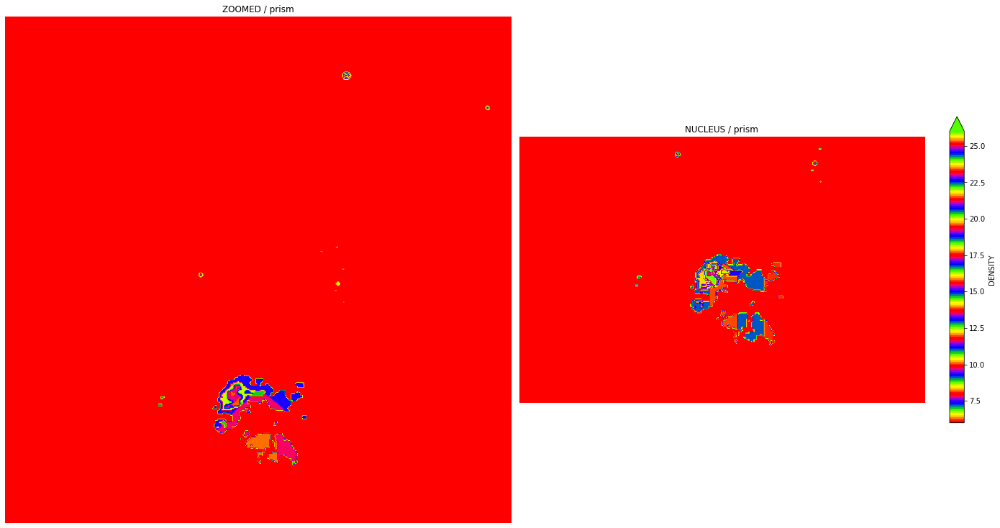

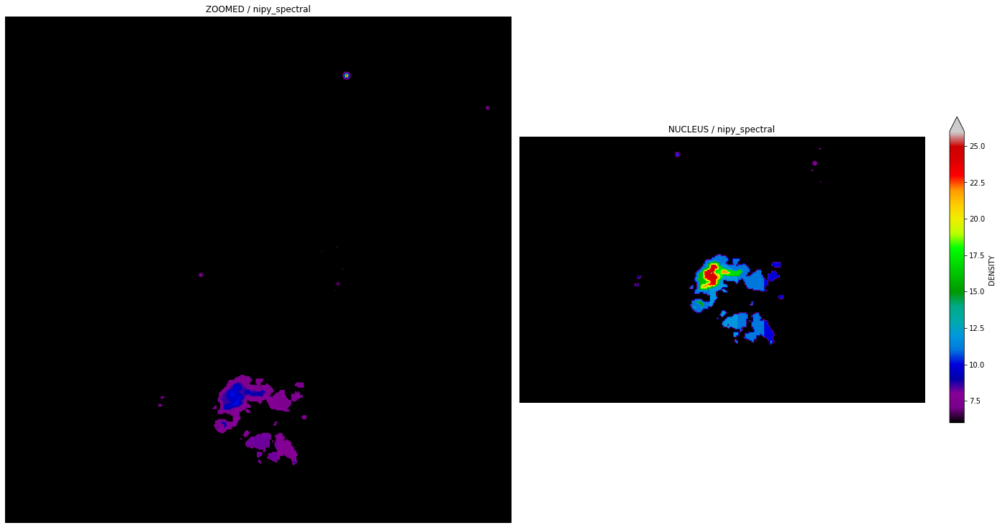

...

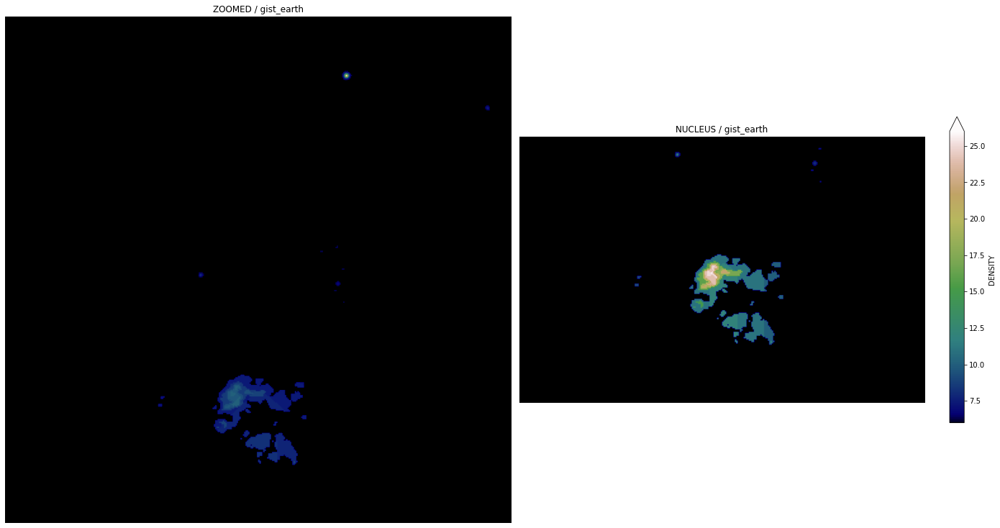

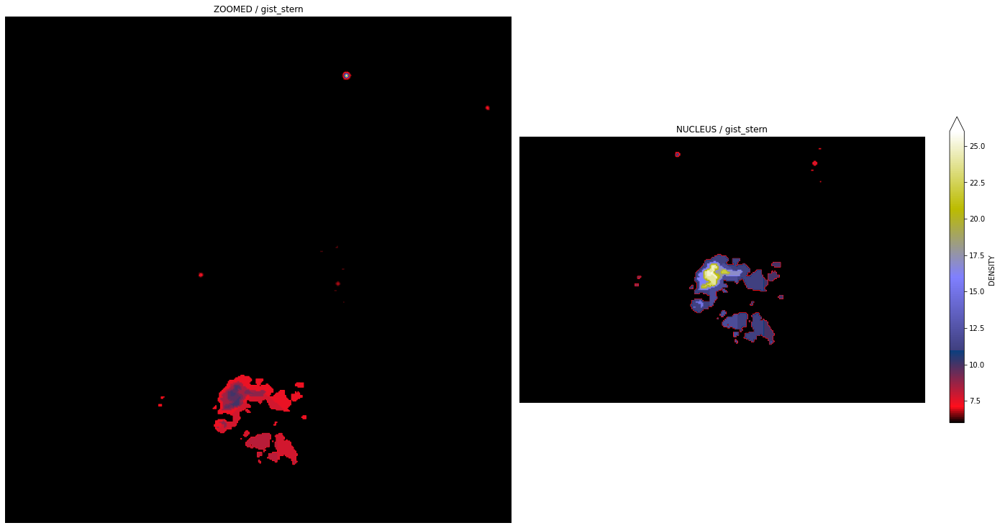

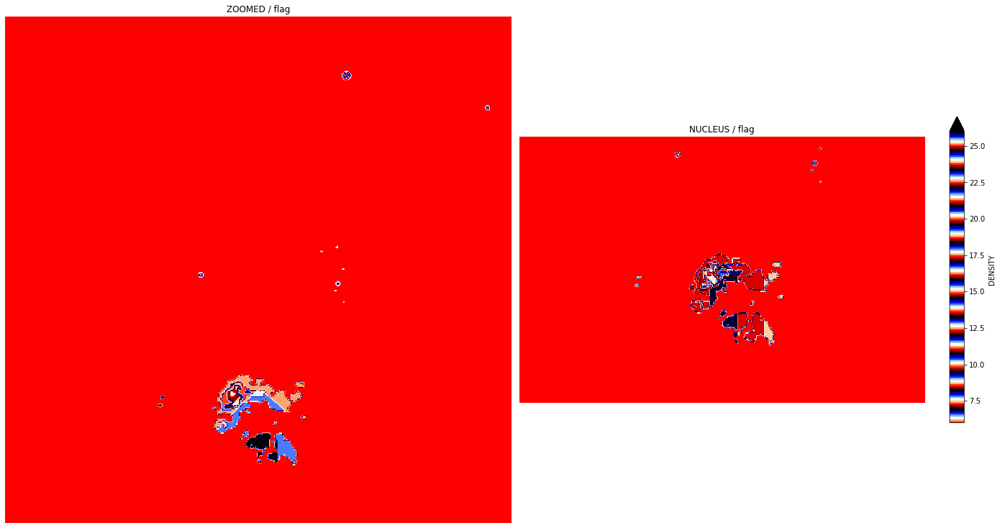

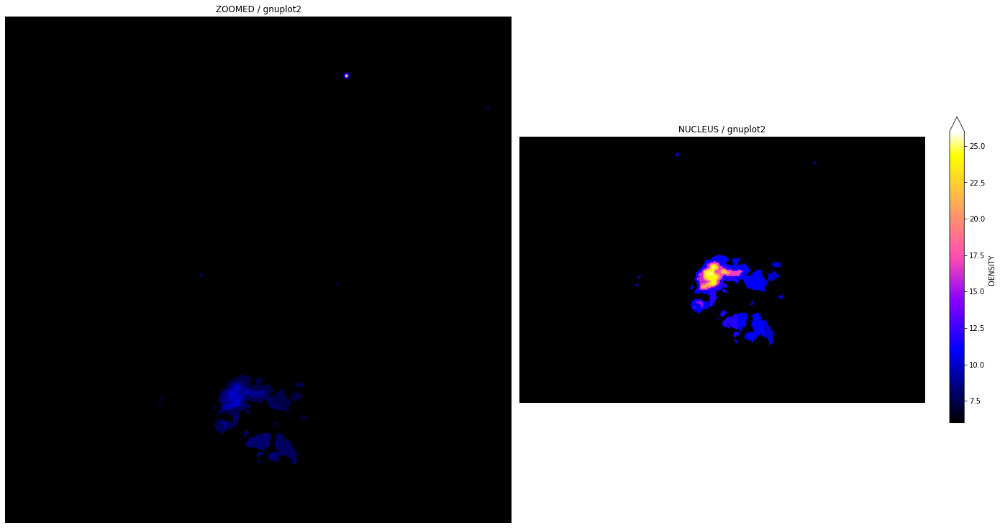

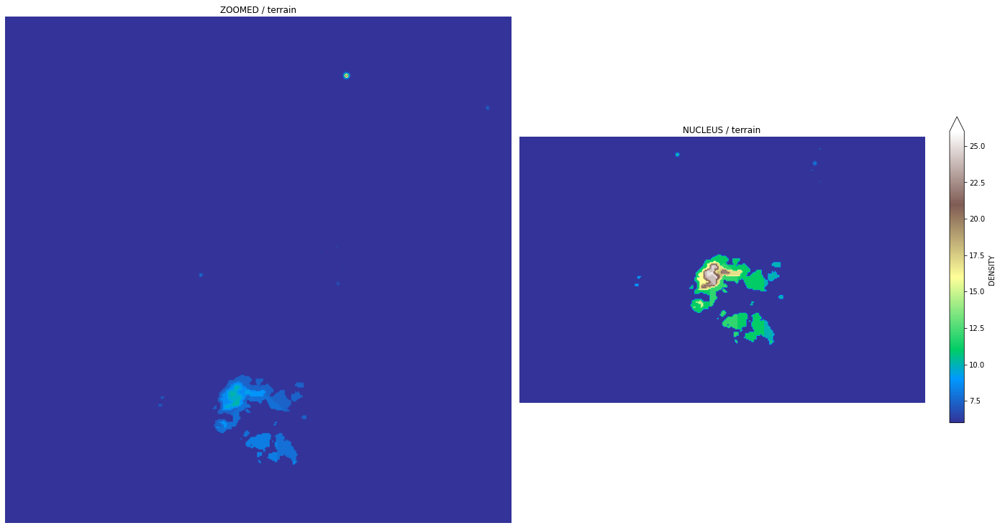

In [ ]:
for x_spec in SPECTRAL_LIST:
    
    figure,axis = plt.subplots(1,2,figsize=(20,20))
    
    axis[0].imshow(CLAHE_ZOOMED_X2,cmap=x_spec)
    axis[0].set_title("ZOOMED" + " / "+ x_spec)
    axis[0].axis("off")
    
    DENSITY_FUNC = axis[1].imshow(CLAHE_NUCLEUS_CLAHE,cmap=x_spec)
    axis[1].set_title("NUCLEUS" + " / "+ x_spec)
    axis[1].axis("off")
    
    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",extend="max")
    plt.tight_layout()
    plt.show()

In [ ]:
data = ZOOMED_X3_SCALE_HST.flatten()

In [ ]:
data

array([0.14134736, 0.22257417, 0.3537239 , ..., 0.11241787, 0.11014394,
       0.10772523], dtype=float32)

# Specgram : 
The specgram() function in pyplot module of matplotlib library is used to plot a spectrogram. A spectrogram is a visual representation of the spectrum of frequencies of a signal as it varies with time. When applied to an audio signal, spectrograms are sometimes called sonographs, voiceprints, or voicegrams. When the data are represented in a 3D plot they may be called waterfall displays.

Certainly! In the context of the NGC 6946 AGN detection project, spectrograms (specgrams) can be applied specifically for analyzing and processing astronomical signals and data related to the galaxy. Here's how spectrograms can be relevant to this project:

### Application of Spectrograms in the NGC 6946 AGN Detection Project:

#### 1. Time-Frequency Analysis of AGN Signals:
- **Frequency Variation:** Spectrograms help analyze the frequency variations in signals associated with AGN activity within NGC 6946.
  
- **Temporal Changes:** By visualizing how frequency components change over time, specgrams aid in identifying transient events or periodic variations related to AGN behavior.

#### 2. Signal Feature Extraction:
- **AGN Signatures:** Spectrograms assist in extracting characteristic features or signatures specific to AGN emissions, such as broad emission lines or continuum variations.
  
- **Noise Discrimination:** They help distinguish AGN signals from background noise and other astronomical sources, improving the accuracy of AGN detection algorithms.

#### 3. Time-Domain Correlation:
- **Correlating Events:** Specgrams allow for correlating AGN events with other phenomena, such as star formation regions, supernova remnants, or interactions with neighboring galaxies.
  
- **Multi-Wavelength Analysis:** Combined with multi-wavelength data, specgrams enhance the understanding of AGN dynamics and their impact on the galactic environment.

#### 4. Anomaly Detection and Monitoring:
- **Transient Events:** Spectrograms enable the detection of transient AGN events, such as flares or outbursts, which may indicate changes in AGN activity levels.
  
- **Long-Term Monitoring:** By monitoring spectrogram patterns over extended periods, trends in AGN behavior and variability can be studied, aiding in long-term AGN monitoring efforts.

#### 5. Data Visualization for Analysis:
- **Pattern Recognition:** Specgrams provide a visual representation that facilitates pattern recognition and anomaly identification in AGN signals.
  
- **Comparative Analysis:** They allow for comparative analysis between different regions of NGC 6946, identifying variations in AGN characteristics across the galaxy.

### Conclusion:
In the NGC 6946 AGN detection project, spectrograms (specgrams) serve as powerful tools for analyzing AGN signals, extracting relevant features, correlating events, detecting anomalies, and providing visual insights into AGN behavior and variability over time. Their application enhances the project's ability to study AGN dynamics within the galaxy and contributes to a deeper understanding of the AGN population and their interactions within NGC 6946.

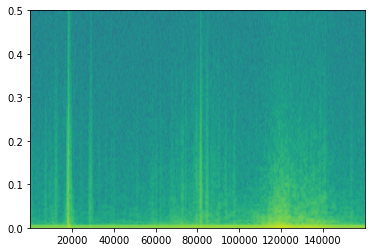

In [ ]:
powerSpectrum_1, freqenciesFound_1, time_1, imageAxis_1=plt.specgram(data,Fs = 1)

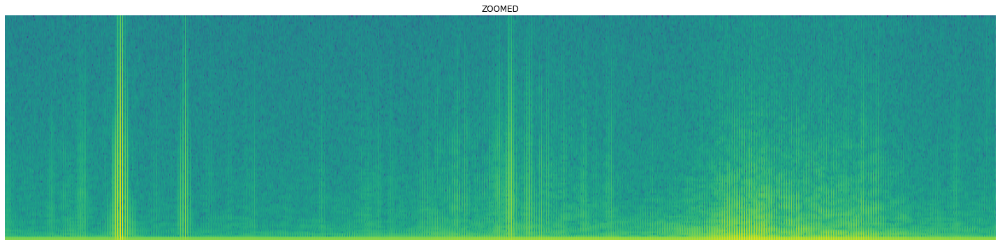

In [ ]:
figure = plt.figure(figsize=(20,5))
powerSpectrum_1, freqenciesFound_1, time_1, imageAxis_1 = plt.specgram(ZOOMED_X3_SCALE_HST.flatten(),Fs = 1)
plt.axis("off")
plt.title("ZOOMED")
plt.tight_layout()
plt.show()

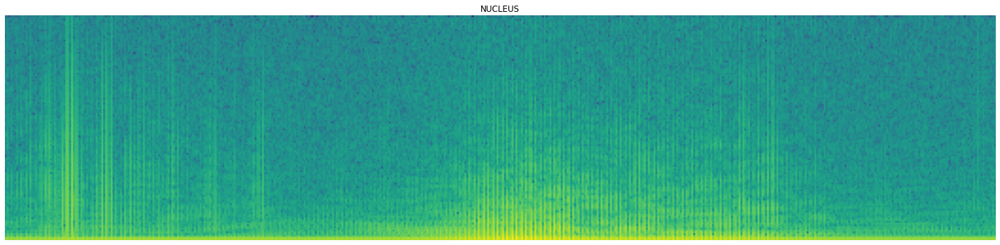

In [ ]:
figure = plt.figure(figsize=(20,5))
powerSpectrum_1, freqenciesFound_1, time_1, imageAxis_1 = plt.specgram(NUCLEUS_SCALE_HST.flatten(),Fs =1)
plt.axis("off")
plt.title("NUCLEUS")
plt.tight_layout()
plt.show()

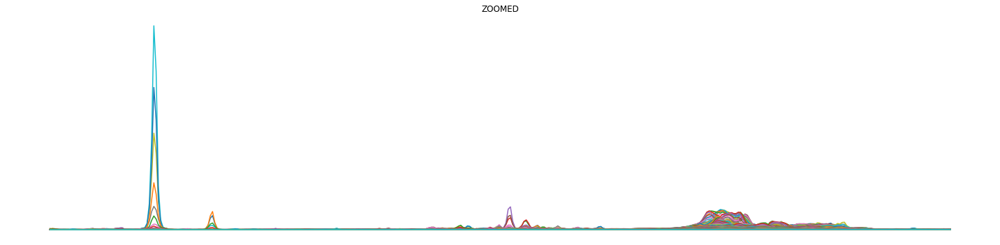

In [ ]:
figure = plt.figure(figsize=(20,5))
plt.axis("off")
plt.title("ZOOMED")
plt.tight_layout()
plt.plot(ZOOMED_X3_SCALE_HST)
plt.show()


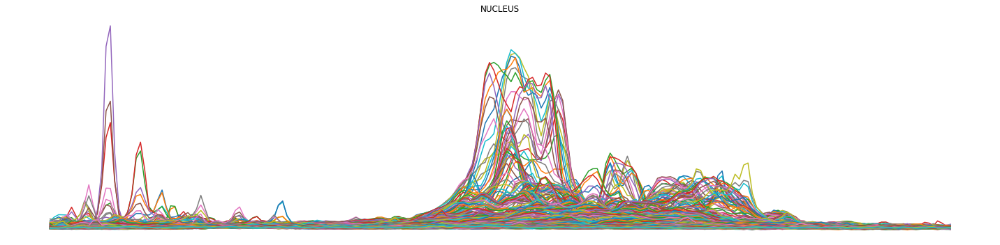

In [ ]:
figure = plt.figure(figsize=(20,5))
plt.axis("off")
plt.title("NUCLEUS")
plt.tight_layout()
plt.plot(NUCLEUS_SCALE_HST)
plt.show()



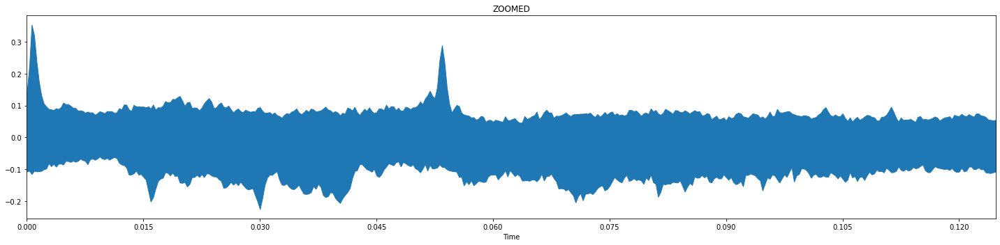

In [ ]:

figure = plt.figure(figsize=(20,5))

librosa.display.waveplot(ZOOMED_X3_SCALE_HST.astype(np.float32),sr=3200)
plt.title("ZOOMED")
plt.tight_layout()
plt.show()

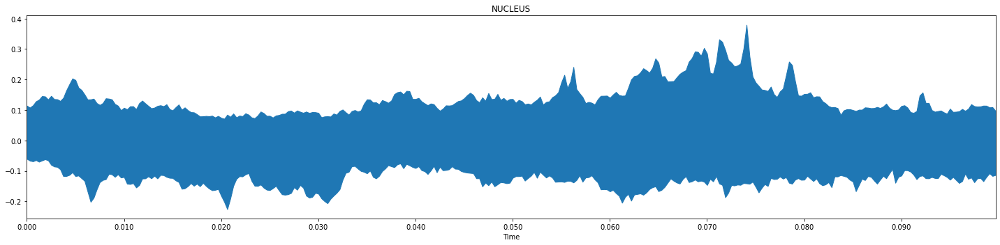

In [ ]:
figure = plt.figure(figsize=(20,5))
librosa.display.waveplot(NUCLEUS_SCALE_HST.astype(np.float32),sr=3200)
plt.title("NUCLEUS")
plt.tight_layout()
plt.show()

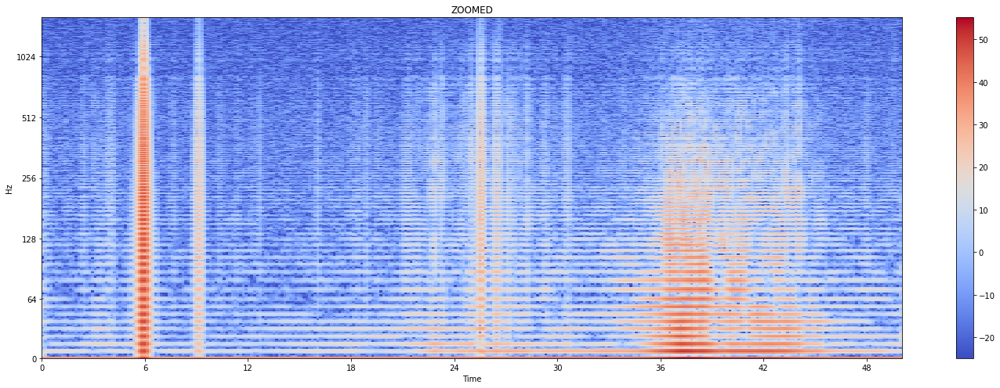

In [ ]:
figure = plt.figure(figsize=(20,7))
ZOOMED_X = librosa.stft(ZOOMED_X3_SCALE_HST.flatten().astype(np.float32))
ZOOMED_XDB = librosa.amplitude_to_db(abs(ZOOMED_X))
librosa.display.specshow(ZOOMED_XDB, sr=3200, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("ZOOMED")
plt.tight_layout()
plt.show()

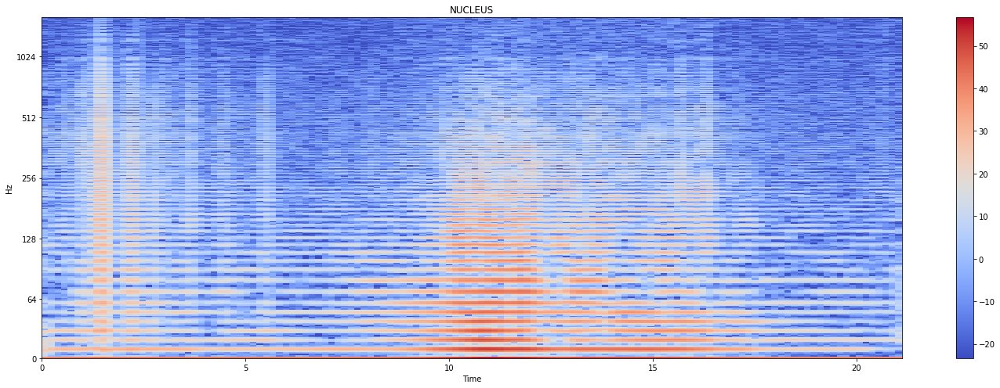

In [ ]:
figure = plt.figure(figsize=(20,7))
NUCLEUS_X = librosa.stft(NUCLEUS_SCALE_HST.flatten().astype(np.float32))
NUCLEUS_XDB = librosa.amplitude_to_db(abs(NUCLEUS_X))
librosa.display.specshow(NUCLEUS_XDB, sr=3200, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("NUCLEUS")
plt.tight_layout()
plt.show()

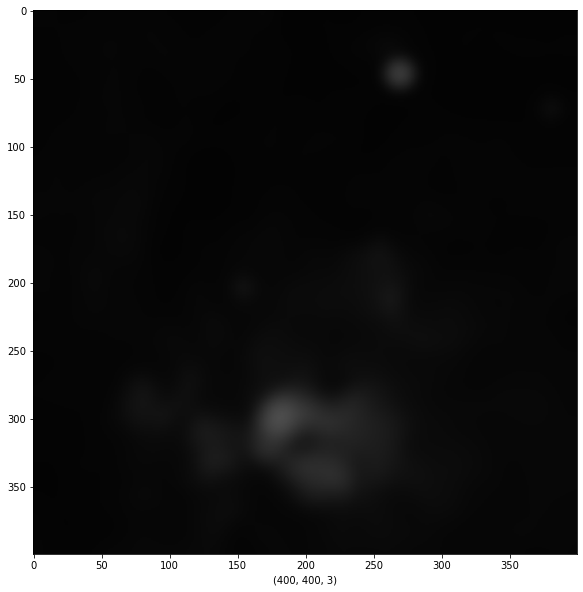

In [ ]:
ZOOM_3D = astropy.visualization.make_lupton_rgb(image_r=GAUSS_ZOOMED_X2.astype('float32'),
                                      image_g=GAUSS_ZOOMED_X2.astype('float32'),
                                      image_b=GAUSS_ZOOMED_X2.astype('float32'))
figure =plt.figure(figsize=(15,10))
plt.tight_layout()
plt.imshow(ZOOM_3D)
plt.xlabel(ZOOM_3D.shape)
plt.show()

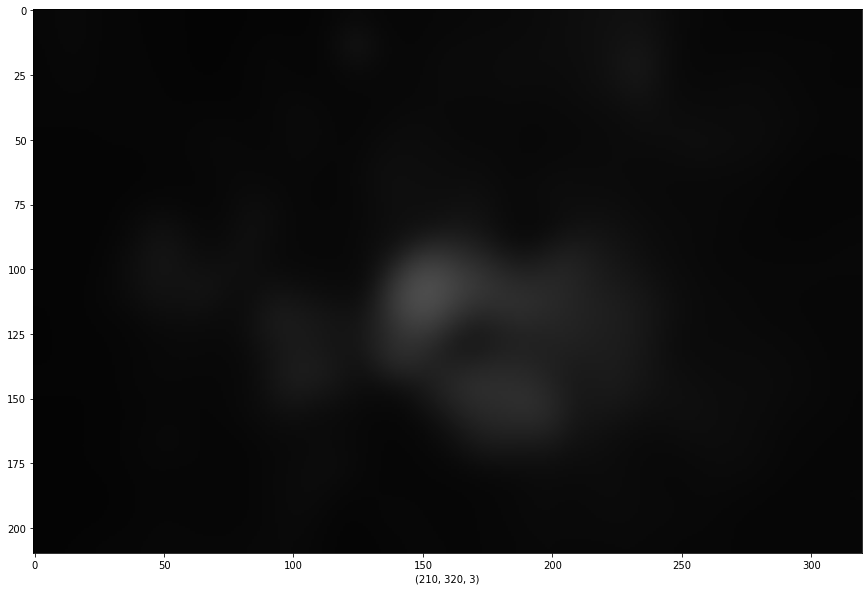

In [ ]:
NUCLEUS_3D = astropy.visualization.make_lupton_rgb(image_r=GAUSS_NUCLEUS.astype('float32'),
                                      image_g=GAUSS_NUCLEUS.astype('float32'),
                                      image_b=GAUSS_NUCLEUS.astype('float32'))
figure = plt.figure(figsize=(15,10))
plt.tight_layout()
plt.imshow(NUCLEUS_3D)
plt.xlabel(NUCLEUS_3D.shape)
plt.show()

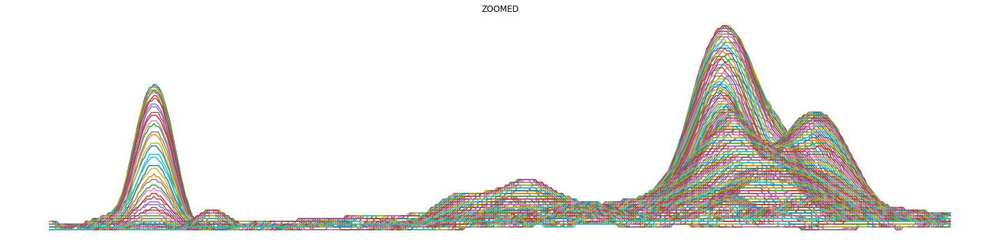

In [ ]:
figure = plt.figure(figsize=(20,5))
plt.axis("off")
plt.title("ZOOMED")
plt.tight_layout()
plt.plot(ZOOM_3D[:,:,0])
plt.show()

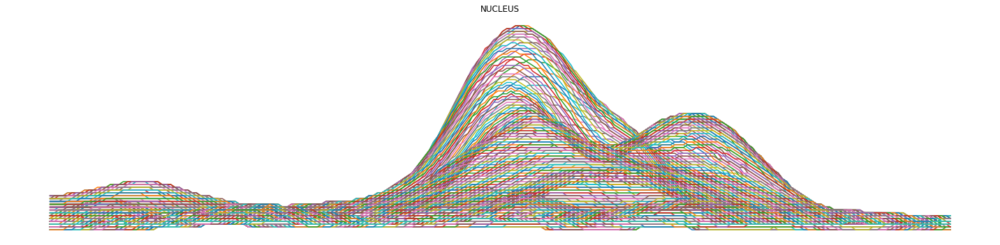

In [ ]:
figure = plt.figure(figsize=(20,5))
plt.axis("off")
plt.title("NUCLEUS")
plt.tight_layout()
plt.plot(NUCLEUS_3D[:,:,0])
plt.show()

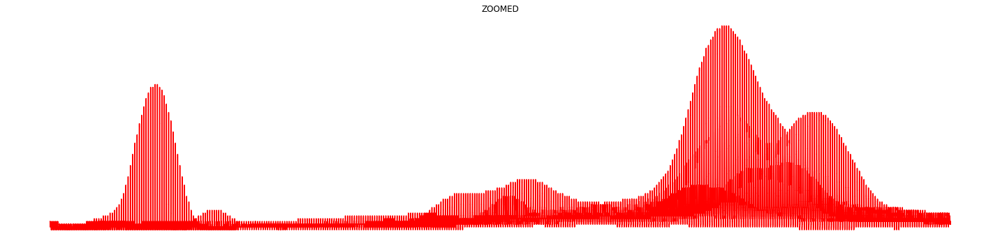

In [ ]:
figure = plt.figure(figsize=(20,5))
plt.axis("off")
plt.title("ZOOMED")
plt.tight_layout()
plt.plot(ZOOM_3D.flatten(),color="red")
plt.show()

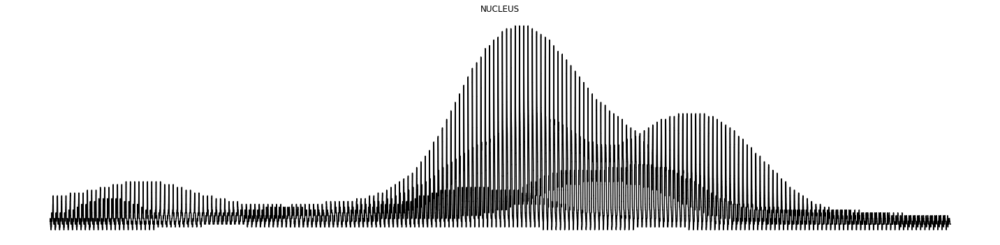

In [ ]:
figure = plt.figure(figsize=(20,5))
plt.axis("off")
plt.title("NUCLEUS")
plt.tight_layout()
plt.plot(NUCLEUS_3D.flatten(),color="black")
plt.show()